### Geospatial Exploration Challenge: Examining Climatic and Health Variables in Rajasthan

**Objective:** Conduct a detailed geospatial analysis of climatic and health variables from a particular region in Rajasthan to uncover potential connections and patterns.

**Dataset Description:** You are provided with a village-level dataset containing the following variables:


●	'rajas_id': Unique identification code for the region

●	'block_code_census': Census block code for the region

●	'rain': Rainfall data

●	'population_density': Population density in the region

●	'rural_facilities': Number of healthcare facilities in rural areas

●	'land_surface_temperature_during_day': Daytime land surface temperature

●	'land_surface_temperature_during_night': Nighttime land surface temperature

●	'ultraviolet_index': Ultraviolet index

●	'pm_2.5': Particulate Matter (PM 2.5) concentration

●	'geometry': Geometric data representing the region

●	'number_of_tb_cases': Number of tuberculosis cases

●	'number_of_heart_disease_cases': Number of heart disease cases

●	'number_of_cancer_cases': Number of cancer cases

●	'number_of_child_malnutrition_cases': Number of child malnutrition cases

●	'number_of_maternal_anemia_cases': Number of maternal anemia cases

●	'number_of_smoker_cases': Number of cases related to smoking

●	'Number_of_lung_problem_cases': Number of cases related to lung problem


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
import geopandas as gpd
import pandas as pd
import math

import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
import numpy as np

In [4]:
df = gpd.read_file('/content/drive/MyDrive/Colab Notebooks/climate_health_anonymized_dataset.geojson')
df.head()

,rajas_id,block_code_census,rain,population_density,rural_facilities,land_surface_temperature_during_day,land_surface_temperature_during_night,ultraviolet_index,pm_2.5,number_of_tb_cases,number_of_heart_disease_cases,number_of_cancer_cases,number_of_child_malnutrition_cases,number_of_maternal_anemia_cases,number_of_smoker_cases,number_of_lung_problem_cases,geometry
0,1.0,3151,2.631036,5.861466,148.0,15297.0,14574.0,10.089448,41.219,0,14,14,2,15,37,16,"POLYGON ((74.33266 23.07299, 74.33477 23.07139..."
1,2.0,3151,2.631036,5.861466,148.0,15297.0,14574.0,10.089448,41.219,44,15,11,9,3,82,23,"POLYGON ((74.34126 23.08345, 74.34021 23.08190..."
2,3.0,3151,2.631036,5.861466,148.0,15297.0,14574.0,10.089448,41.219,22,15,3,8,8,2,35,"POLYGON ((74.34524 23.08420, 74.34808 23.08415..."
3,4.0,3151,2.631036,5.861466,148.0,15297.0,14574.0,10.089448,41.219,42,1,0,10,13,44,39,"POLYGON ((74.36026 23.09077, 74.36011 23.09064..."
4,5.0,3151,2.631036,5.861466,148.0,15297.0,14574.0,10.089448,41.219,29,1,13,12,15,78,39,"POLYGON ((74.34161 23.09282, 74.34224 23.09177..."


<Axes: >

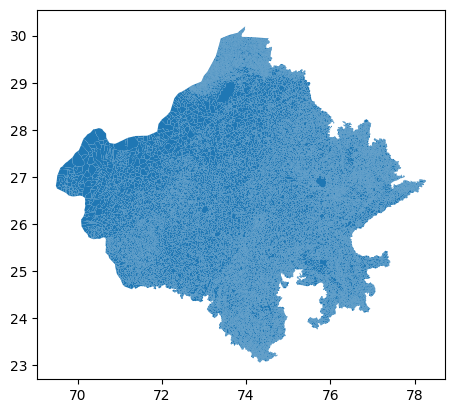

In [5]:
df.plot()

## 1.Data Exploration

In [6]:
df.isnull().sum()

rajas_id                                 0
block_code_census                        0
rain                                     0
population_density                       0
rural_facilities                         0
land_surface_temperature_during_day      0
land_surface_temperature_during_night    0
ultraviolet_index                        0
pm_2.5                                   0
number_of_tb_cases                       0
number_of_heart_disease_cases            0
number_of_cancer_cases                   0
number_of_child_malnutrition_cases       0
number_of_maternal_anemia_cases          0
number_of_smoker_cases                   0
number_of_lung_problem_cases             0
geometry                                 0
dtype: int64

In [9]:

climate_vars = ['rain', 'land_surface_temperature_during_day', 'land_surface_temperature_during_night',
                       'ultraviolet_index', 'pm_2.5']
health_vars =[ 'number_of_tb_cases', 'number_of_heart_disease_cases',
                       'number_of_cancer_cases', 'number_of_child_malnutrition_cases',
                       'number_of_maternal_anemia_cases', 'number_of_smoker_cases', 'number_of_lung_problem_cases']


In [10]:
df[climate_vars].describe()

,rain,land_surface_temperature_during_day,land_surface_temperature_during_night,ultraviolet_index,pm_2.5
count,45040.000000,45040.000000,45040.000000,45040.000000,45040.000000
mean,1.722710,15194.433583,14488.068024,9.291404,40.358566
std,0.638836,123.458932,103.713822,0.460019,7.877425
min,0.555787,14770.000000,14145.000000,8.255349,26.384000
25%,1.220894,15128.000000,14438.000000,9.060457,35.082000
50%,1.720100,15194.433583,14498.000000,9.302398,37.938500
75%,2.160050,15277.000000,14555.000000,9.688249,42.740000
max,3.057708,15537.000000,14871.000000,10.089448,68.493000


In [11]:
df[health_vars].describe()

,number_of_tb_cases,number_of_heart_disease_cases,number_of_cancer_cases,number_of_child_malnutrition_cases,number_of_maternal_anemia_cases,number_of_smoker_cases,number_of_lung_problem_cases
count,45040.000000,45040.000000,45040.000000,45040.000000,45040.000000,45040.000000,45040.000000
mean,28.941940,9.480617,6.987300,6.499578,10.542695,52.286234,21.999201
std,17.078779,5.767125,4.322654,4.031030,6.350662,30.697567,13.032324
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,14.000000,4.000000,3.000000,3.000000,5.000000,26.000000,11.000000
50%,29.000000,10.000000,7.000000,6.500000,11.000000,52.000000,22.000000
75%,44.000000,14.000000,11.000000,10.000000,16.000000,79.000000,33.000000
max,58.000000,19.000000,14.000000,13.000000,21.000000,105.000000,44.000000


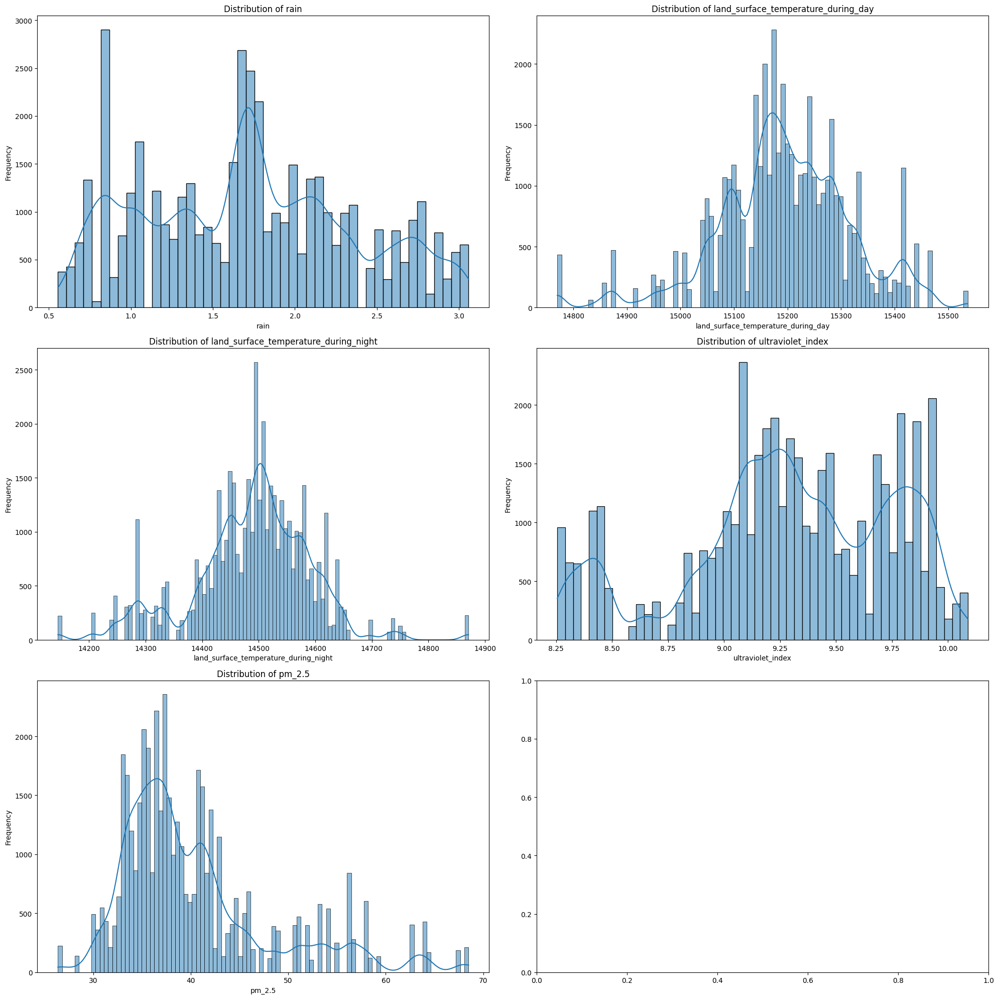

In [20]:
fig, axes = plt.subplots(3, 2, figsize=(20, 20))
axes = axes.flatten()

for i, col in enumerate(climate_vars):
    sns.histplot(df[col], ax=axes[i], kde=True)
    axes[i].set_title(f'Distribution of {col}')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

Some skewness exists but mostly all varaibles are normally distributed.

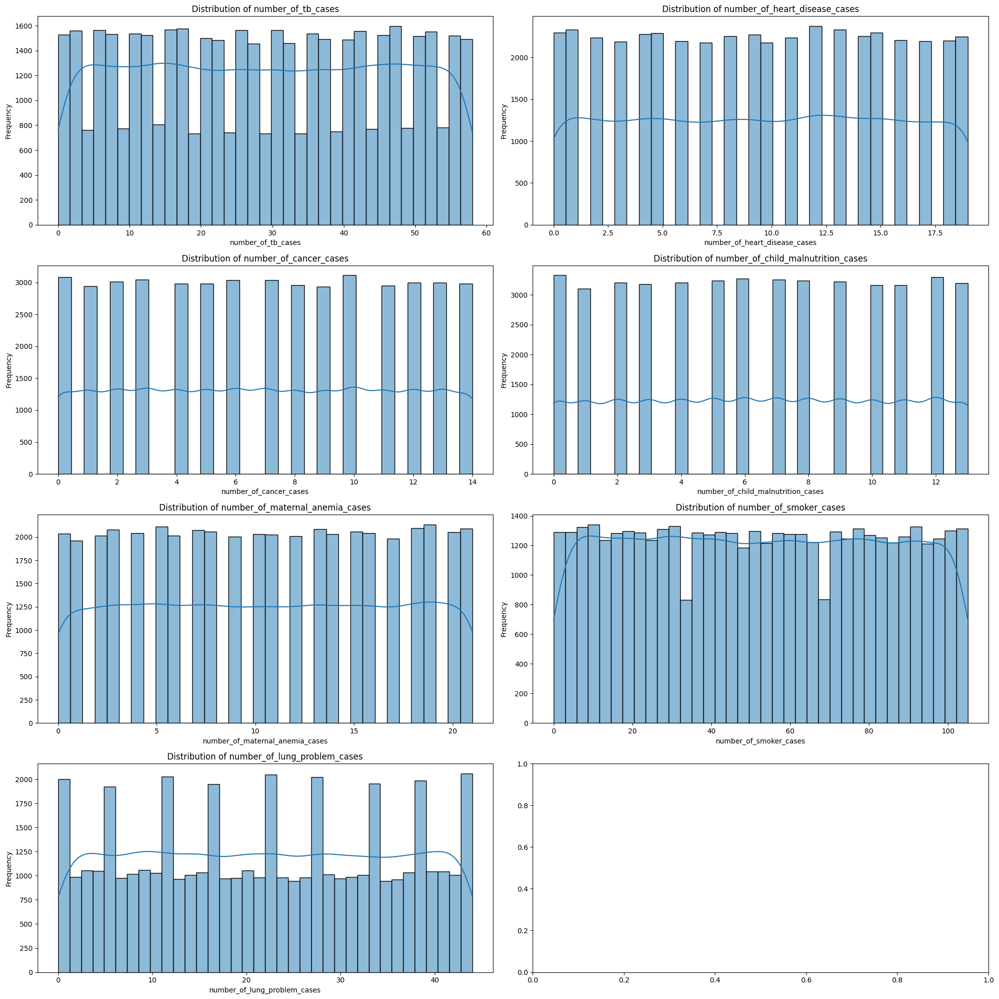

In [21]:
fig, axes = plt.subplots(4, 2, figsize=(20, 20))
axes = axes.flatten()

for i, col in enumerate(health_vars):
    sns.histplot(df[col], ax=axes[i], kde=True)
    axes[i].set_title(f'Distribution of {col}')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

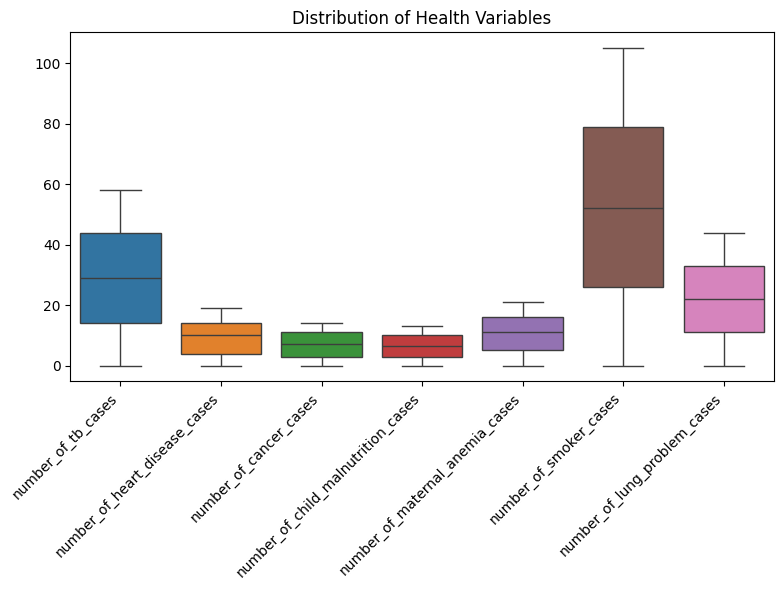

In [25]:
def create_boxplots(data, variables, title):
    plt.figure(figsize=(8, 6))
    sns.boxplot(data=data[variables])
    plt.title(title)
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

# Create boxplots for health variables
# Question: What is the distribution of each health variable, and are there any outliers?
create_boxplots(df, health_vars, 'Distribution of Health Variables')



The health variables are mostly uniformly distributed. Some conditions like smoker,lung issues and tb have high variablility. More investigation is needed on this by geography.

In [12]:
# Initialize the scaler
scaler = MinMaxScaler()

# Apply scaling and create new columns
for var in health_vars:
    scaled_var_name = f"{var}_scaled"
    df[scaled_var_name] = scaler.fit_transform(df[[var]])

# Display the dataframe to verify
df.head()

,rajas_id,block_code_census,rain,population_density,rural_facilities,land_surface_temperature_during_day,land_surface_temperature_during_night,ultraviolet_index,pm_2.5,number_of_tb_cases,...,land_surface_temperature_during_day_scaled,land_surface_temperature_during_night_scaled,ultraviolet_index_scaled,number_of_tb_cases_scaled,number_of_heart_disease_cases_scaled,number_of_cancer_cases_scaled,number_of_child_malnutrition_cases_scaled,number_of_maternal_anemia_cases_scaled,number_of_smoker_cases_scaled,number_of_lung_problem_cases_scaled
0,1.0,3151,2.631036,5.861466,148.0,15297.0,14574.0,10.089448,41.219,0,...,0.687093,0.590909,1.0,0.000000,0.736842,1.000000,0.153846,0.714286,0.352381,0.363636
1,2.0,3151,2.631036,5.861466,148.0,15297.0,14574.0,10.089448,41.219,44,...,0.687093,0.590909,1.0,0.758621,0.789474,0.785714,0.692308,0.142857,0.780952,0.522727
2,3.0,3151,2.631036,5.861466,148.0,15297.0,14574.0,10.089448,41.219,22,...,0.687093,0.590909,1.0,0.379310,0.789474,0.214286,0.615385,0.380952,0.019048,0.795455
3,4.0,3151,2.631036,5.861466,148.0,15297.0,14574.0,10.089448,41.219,42,...,0.687093,0.590909,1.0,0.724138,0.052632,0.000000,0.769231,0.619048,0.419048,0.886364
4,5.0,3151,2.631036,5.861466,148.0,15297.0,14574.0,10.089448,41.219,29,...,0.687093,0.590909,1.0,0.500000,0.052632,0.928571,0.923077,0.714286,0.742857,0.886364


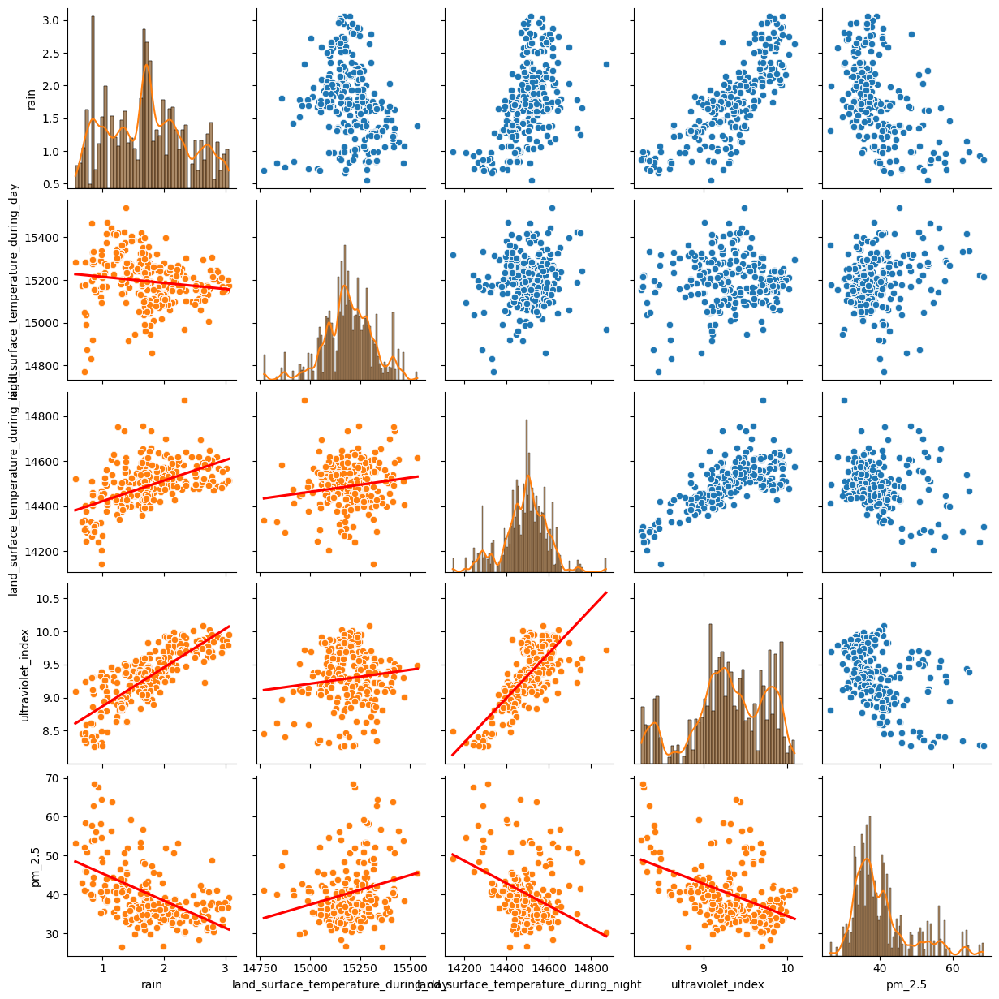

In [12]:
# Pair plots between all climate_vars to check for collinearity / relationships

g=sns.pairplot(df[climate_vars])
g.map_lower(sns.scatterplot)
g.map_lower(sns.regplot, scatter=False, color='red')
g.map_diag(sns.histplot, kde=True)

plt.show()

<ipython-input-27-f2182312ab88>:15: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


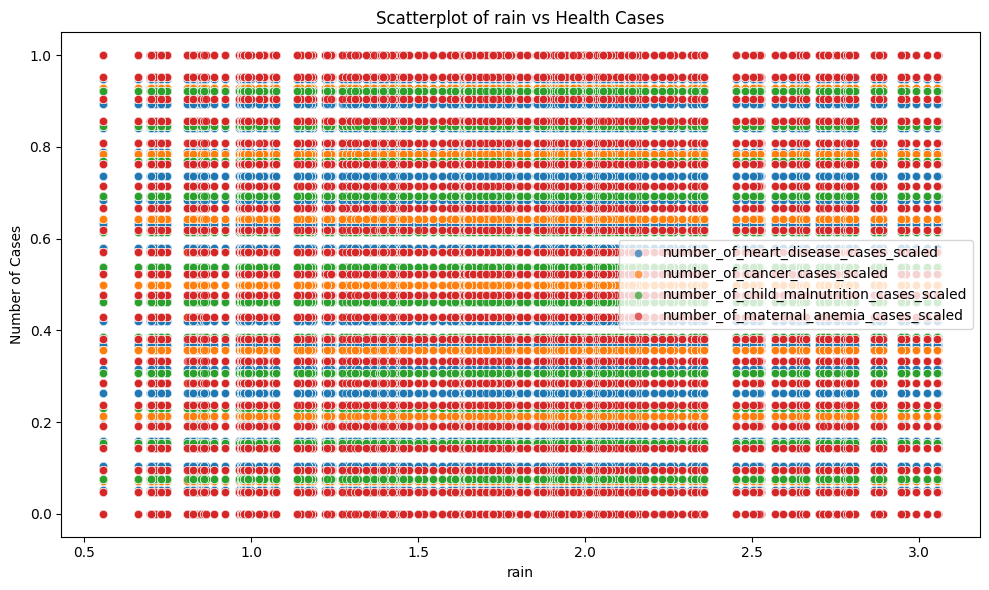

<ipython-input-27-f2182312ab88>:15: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


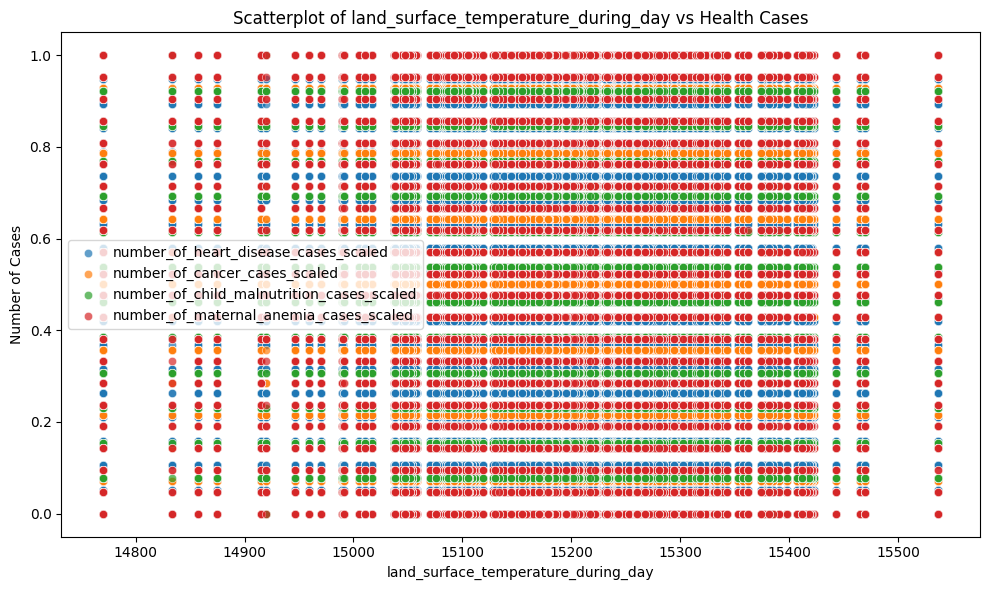

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


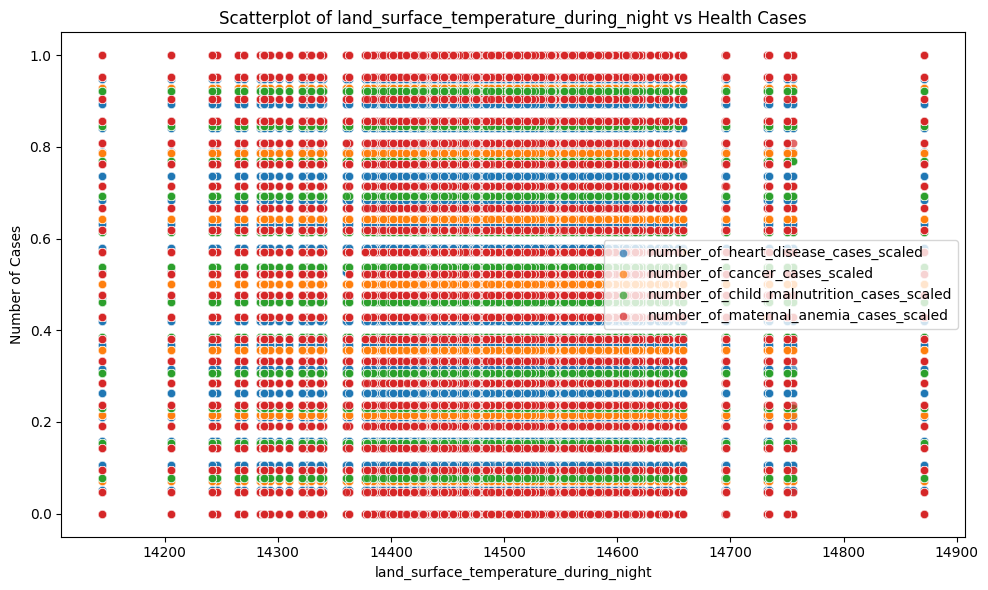

In [27]:
health_cases = ['number_of_heart_disease_cases_scaled', 'number_of_cancer_cases_scaled',
       'number_of_child_malnutrition_cases_scaled',
       'number_of_maternal_anemia_cases_scaled',]
for c_var in climate_vars[:3]:
    plt.figure(figsize=(10, 6))

    # Loop over each health case variable
    for h_var in health_cases:
        sns.scatterplot(x=c_var, y=h_var, data=df, label=h_var, alpha=0.7)

    plt.title(f'Scatterplot of {c_var} vs Health Cases')
    plt.xlabel(c_var)
    plt.ylabel('Number of Cases')
    plt.legend()
    plt.tight_layout()
    plt.show()

<ipython-input-28-4f5cb002a24b>:13: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()


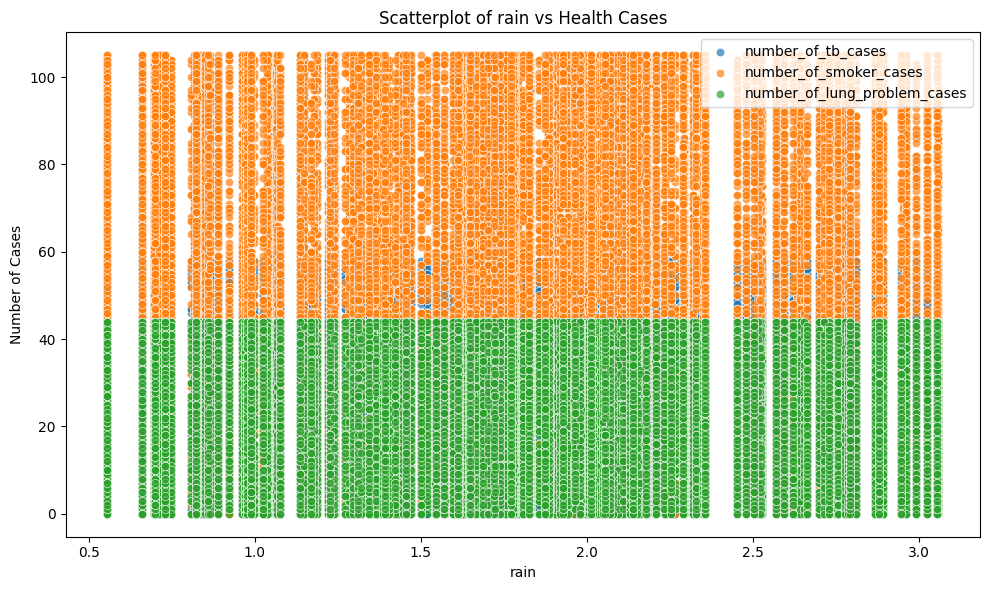

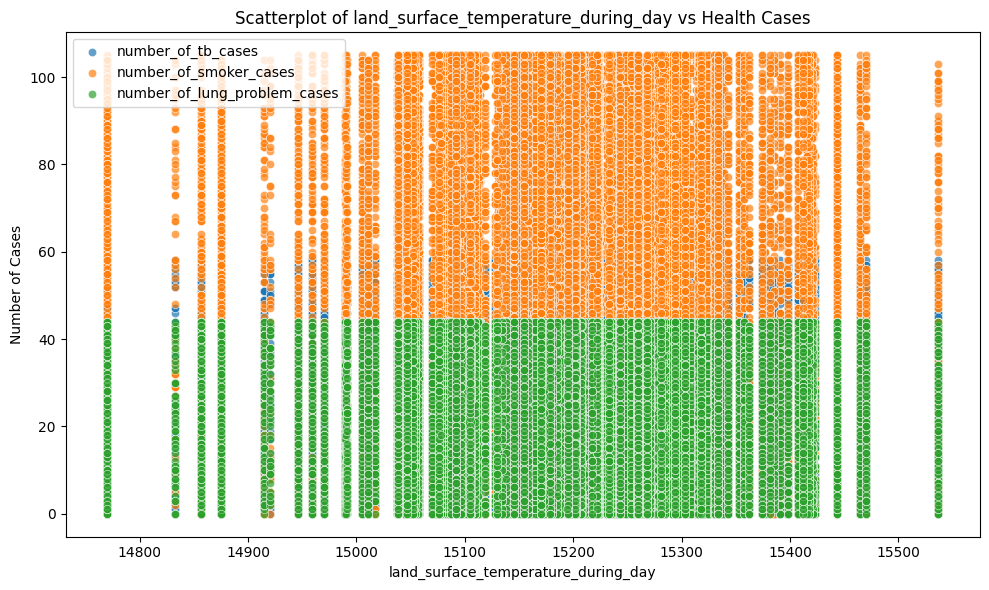

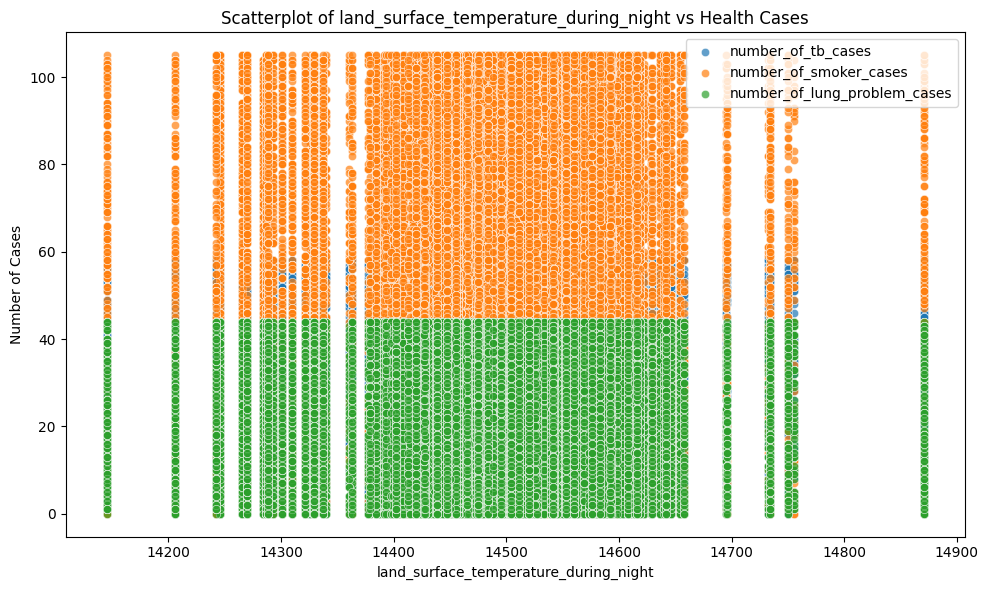

In [28]:
health_cases = ['number_of_tb_cases', 'number_of_smoker_cases', 'number_of_lung_problem_cases']
for c_var in climate_vars[:3]:
    plt.figure(figsize=(10, 6))

    # Loop over each health case variable
    for h_var in health_cases:
        sns.scatterplot(x=c_var, y=h_var, data=df, label=h_var, alpha=0.7)

    plt.title(f'Scatterplot of {c_var} vs Health Cases')
    plt.xlabel(c_var)
    plt.ylabel('Number of Cases')
    plt.legend()
    plt.tight_layout()
    plt.show()

**INSIGHTS**

The health case variables are uniformly distributed across different levels of rainfall and temperature, that suggests that variations in these climate factors do not lead to observable changes in health outcomes in the dataset. However, a geographical view of these might help understand this better.

After looking at the spread of the variables, we can conclude the following :

- Scaling is crucial to ensure that all variables contribute equally to statistical models and analyses, avoiding domination by variables with larger scales.
- Both environmental and health variables show variability, with some health metrics (like smoking rates) showing more significant regional differences.

### 2.	Geospatial Visualization and 4. Spatial Analysis

In [8]:
# Function to apply log transformation and Min-Max scaling
def log_and_scale(x):
    return scaler.fit_transform(np.log1p(x.values.reshape(-1, 1))).flatten()

# Apply transformations and create new columns
df['rain_scaled'] = log_and_scale(df['rain'])
df['pm_2.5_scaled'] = log_and_scale(df['pm_2.5'])

# Apply Min-Max scaling to other climate variables and create new columns
climate_vars = ['land_surface_temperature_during_day', 'land_surface_temperature_during_night', 'ultraviolet_index']
for var in climate_vars:
    scaled_var_name = f"{var}_scaled"
    df[scaled_var_name] = scaler.fit_transform(df[[var]])


df.head()

,rajas_id,block_code_census,rain,population_density,rural_facilities,land_surface_temperature_during_day,land_surface_temperature_during_night,ultraviolet_index,pm_2.5,number_of_tb_cases,...,number_of_child_malnutrition_cases,number_of_maternal_anemia_cases,number_of_smoker_cases,number_of_lung_problem_cases,geometry,rain_scaled,pm_2.5_scaled,land_surface_temperature_during_day_scaled,land_surface_temperature_during_night_scaled,ultraviolet_index_scaled
0,1.0,3151,2.631036,5.861466,148.0,15297.0,14574.0,10.089448,41.219,0,...,2,15,37,16,"POLYGON ((74.33266 23.07299, 74.33477 23.07139...",0.884106,0.464863,0.687093,0.590909,1.0
1,2.0,3151,2.631036,5.861466,148.0,15297.0,14574.0,10.089448,41.219,44,...,9,3,82,23,"POLYGON ((74.34126 23.08345, 74.34021 23.08190...",0.884106,0.464863,0.687093,0.590909,1.0
2,3.0,3151,2.631036,5.861466,148.0,15297.0,14574.0,10.089448,41.219,22,...,8,8,2,35,"POLYGON ((74.34524 23.08420, 74.34808 23.08415...",0.884106,0.464863,0.687093,0.590909,1.0
3,4.0,3151,2.631036,5.861466,148.0,15297.0,14574.0,10.089448,41.219,42,...,10,13,44,39,"POLYGON ((74.36026 23.09077, 74.36011 23.09064...",0.884106,0.464863,0.687093,0.590909,1.0
4,5.0,3151,2.631036,5.861466,148.0,15297.0,14574.0,10.089448,41.219,29,...,12,15,78,39,"POLYGON ((74.34161 23.09282, 74.34224 23.09177...",0.884106,0.464863,0.687093,0.590909,1.0


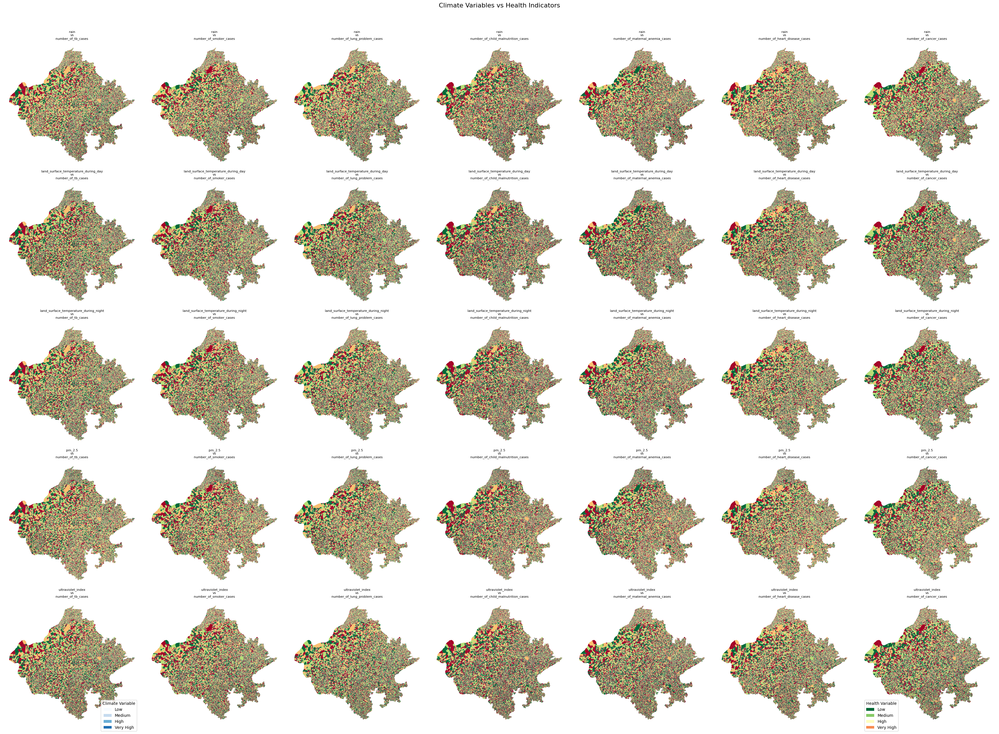

<Figure size 640x480 with 0 Axes>

In [29]:
# Define variable sets
climate_vars = ['rain',
                'land_surface_temperature_during_day',
                'land_surface_temperature_during_night',
                'pm_2.5',
                'ultraviolet_index']

health_vars = ['number_of_tb_cases', 'number_of_smoker_cases', 'number_of_lung_problem_cases',
               'number_of_child_malnutrition_cases', 'number_of_maternal_anemia_cases',
               'number_of_heart_disease_cases', 'number_of_cancer_cases']

# Function to create categories
def categorize_variable(df, var):
    return pd.cut(df[var], bins=4, labels=['Low', 'Medium', 'High', 'Very High'])

# Create categories for all variables
for var in climate_vars + health_vars:
    df[f'{var}_category'] = categorize_variable(df, var)

# Create maps
fig, axes = plt.subplots(len(climate_vars), len(health_vars), figsize=(5*len(health_vars), 5*len(climate_vars)))

# Ensure axes is always 2D
if len(climate_vars) == 1 or len(health_vars) == 1:
    axes = axes.reshape(len(climate_vars), len(health_vars))

for i, climate_var in enumerate(climate_vars):
    for j, health_var in enumerate(health_vars):
        ax = axes[i, j]

        # Plot climate variable
        df.plot(ax=ax, column=f'{climate_var}_category', cmap='Blues', legend=False,
                categorical=True, alpha=0.6)

        # Plot health variable
        df.plot(ax=ax, column=f'{health_var}_category', cmap='RdYlGn_r', legend=False,
                categorical=True)

        ax.set_title(f'{climate_var.replace("_scaled", "")}\nvs\n{health_var}', fontsize=8)
        ax.axis('off')

# Add overall title
fig.suptitle('Climate Variables vs Health Indicators', fontsize=16, y=1.02)

# Add legends
climate_legend_elements = [plt.Rectangle((0,0),1,1, facecolor=plt.cm.Blues(i/4), edgecolor='none') for i in range(4)]
health_legend_elements = [plt.Rectangle((0,0),1,1, facecolor=plt.cm.RdYlGn_r(i/4), edgecolor='none') for i in range(4)]

fig.legend(climate_legend_elements, ['Low', 'Medium', 'High', 'Very High'],
           loc='lower left', title='Climate Variable', bbox_to_anchor=(0.1, 0))
fig.legend(health_legend_elements, ['Low', 'Medium', 'High', 'Very High'],
           loc='lower right', title='Health Variable', bbox_to_anchor=(0.9, 0))

# Adjust layout and display
plt.tight_layout()
plt.show()

# Optionally, save the figure
plt.savefig('climate_health_maps.png', dpi=300, bbox_inches='tight')

There is an emergent pattern on the western side of Rajasthan where the occurances seem to be more.

In [32]:
pip install contextily

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.5/21.5 MB 29.4 MB/s eta 0:00:00


In [33]:
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import geopandas as gpd
import contextily as ctx

def create_choropleth(df, column, title, overlay_column, overlay_label, overlay_cmap, file_name):
    fig, ax = plt.subplots(figsize=(15, 10))

    # Plot the main choropleth map
    df.plot(column=column, cmap='YlOrRd', linewidth=0.8, edgecolor='0.8', ax=ax)

    # Overlay the climate data
    overlay = ax.scatter(df.geometry.centroid.x, df.geometry.centroid.y,
                         c=df[overlay_column], cmap=overlay_cmap, s=20, alpha=0.5)
    plt.colorbar(overlay, label=overlay_label, ax=ax, fraction=0.023, pad=0.04)

    # Add basemap
    ctx.add_basemap(ax, crs=df.crs.to_string(), source=ctx.providers.CartoDB.Positron)

    # Set title and remove axis
    ax.set_title(title, fontsize=16)
    ax.axis('off')

    plt.tight_layout()
    plt.savefig(file_name, dpi=300, bbox_inches='tight')
    plt.close()

# Create maps for different health issues with rainfall and temperature
health_issues = ['number_of_tb_cases', 'number_of_heart_disease_cases', 'number_of_cancer_cases',
                 'number_of_lung_problem_cases']

rain_cmap = LinearSegmentedColormap.from_list("", ["white", "blue"])
temp_cmap = LinearSegmentedColormap.from_list("", ["white", "blue", "green"])

for issue in health_issues:
    create_choropleth(df, issue, f'Distribution of {issue.replace("_", " ").title()} with Rainfall',
                      overlay_column='rain', overlay_label='Rainfall', overlay_cmap=rain_cmap,
                      file_name=f'{issue}_rainfall_map.png')
    create_choropleth(df, issue, f'Distribution of {issue.replace("_", " ").title()} with Temperature',
                      overlay_column='land_surface_temperature_during_day', overlay_label='Temperature',
                      overlay_cmap=temp_cmap, file_name=f'{issue}_temperature_map.png')

print("Maps have been generated and saved.")


<ipython-input-33-0f3f005e51e1>:13: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  overlay = ax.scatter(df.geometry.centroid.x, df.geometry.centroid.y,
<ipython-input-33-0f3f005e51e1>:13: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  overlay = ax.scatter(df.geometry.centroid.x, df.geometry.centroid.y,
<ipython-input-33-0f3f005e51e1>:13: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  overlay = ax.scatter(df.geometry.centroid.x, df.geometry.centroid.y,
<ipython-input-33-0f3f005e51e1>:13: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorre

Maps have been generated and saved.


In [34]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.cm import ScalarMappable
from matplotlib.colorbar import ColorbarBase



# Function to create a choropleth map
def create_choropleth(data, column, title, cmap='viridis'):
    fig, ax = plt.subplots(figsize=(15, 10))

    # Plot the choropleth
    data.plot(column=column, cmap=cmap, linewidth=0.8, edgecolor='0.8', ax=ax)

    # Add a colorbar
    sm = ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=data[column].min(), vmax=data[column].max()))
    sm._A = []
    cbar = fig.colorbar(sm, ax=ax)
    cbar.set_label(column)

    # Add basemap
    ctx.add_basemap(ax, crs=data.crs.to_string(), source=ctx.providers.CartoDB.Positron)

    # Set title and remove axis
    ax.set_title(title, fontsize=16)
    ax.axis('off')

    plt.tight_layout()
    return fig, ax

# Create maps for different health issues
health_issues = ['number_of_tb_cases', 'number_of_heart_disease_cases', 'number_of_cancer_cases',
                 'number_of_child_malnutrition_cases', 'number_of_maternal_anemia_cases',
                 'number_of_smoker_cases', 'number_of_lung_problem_cases']

for issue in health_issues:
    create_choropleth(df, issue, f'Distribution of {issue.replace("_", " ").title()}')
    plt.savefig(f'{issue}_map.png', dpi=300, bbox_inches='tight')
    plt.close()

# Create a map overlaying health issues with climatic data
fig, ax = plt.subplots(figsize=(15, 10))

# Plot total health cases
df['total_health_cases'] = df[health_issues].sum(axis=1)
df.plot(column='total_health_cases', cmap='YlOrRd', linewidth=0.8, edgecolor='0.8', ax=ax)

# Overlay rainfall data
rain_cmap = LinearSegmentedColormap.from_list("", ["white", "blue"])
rain = ax.scatter(df.geometry.centroid.x, df.geometry.centroid.y,
                  c=df['rain'], cmap=rain_cmap, s=20, alpha=0.5)
plt.colorbar(rain, label='Rainfall', ax=ax, fraction=0.023, pad=0.04)


# Add basemap
ctx.add_basemap(ax, crs=df.crs.to_string(), source=ctx.providers.CartoDB.Positron)

# Set title and remove axis
ax.set_title('Distribution of Health Cases with Climate Overlay', fontsize=16)
ax.axis('off')

plt.tight_layout()
plt.savefig('health_cases_with_rain.png', dpi=300, bbox_inches='tight')
plt.close()

print("Maps have been generated and saved.")

<ipython-input-34-d0f2512f5056>:52: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  rain = ax.scatter(df.geometry.centroid.x, df.geometry.centroid.y,


Maps have been generated and saved.


In [ ]:
import geopandas as gpd
import folium
from branca.colormap import LinearColormap


# Function to create interactive choropleth map using Folium
def create_interactive_choropleth(df, title, columns, file_name):
    # Initialize the Folium map centered around the mean of geometries
    centroid_lat = df.geometry.centroid.y.mean()
    centroid_lon = df.geometry.centroid.x.mean()
    m = folium.Map(location=[centroid_lat, centroid_lon], zoom_start=10)

    # Add choropleth layer for each column in columns list
    for column in columns:
        folium.Choropleth(
            geo_data=df,
            data=df,
            columns=['rajas_id', column],
            key_on='feature.properties.rajas_id',
            fill_color='YlOrRd',
            fill_opacity=0.7,
            line_opacity=0.2,
            legend_name=title,
            name=title,
        ).add_to(m)

    # Add layer control
    folium.LayerControl().add_to(m)

    # Save the map as HTML
    m.save(file_name)

# Create interactive choropleth map for all health and climate variables
all_vars = health_vars + climate_vars
create_interactive_choropleth(df, 'Distribution of Health and Climate Variables', all_vars, 'interactive_map.html')

print("Interactive choropleth map has been generated and saved as 'interactive_map.html'.")


<ipython-input-29-41381e967beb>:9: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  centroid_lat = df.geometry.centroid.y.mean()
<ipython-input-29-41381e967beb>:10: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  centroid_lon = df.geometry.centroid.x.mean()


#### Clustering using K Means Clustering

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


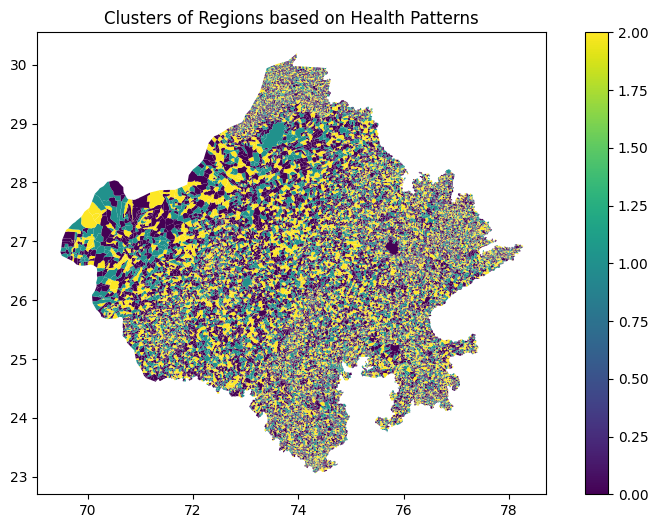

In [ ]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import folium


scaled_features = [
    'number_of_tb_cases_scaled', 'number_of_heart_disease_cases_scaled', 'number_of_cancer_cases_scaled',
    'number_of_child_malnutrition_cases_scaled', 'number_of_maternal_anemia_cases_scaled',
    'number_of_smoker_cases_scaled', 'number_of_lung_problem_cases_scaled',
    'total_health_cases', 'total_health_ncases']

# Create a feature matrix from the scaled columns
features = df[scaled_features]

# Perform K-Means clustering
kmeans = KMeans(n_clusters=3, random_state=42)
df['cluster'] = kmeans.fit_predict(features)

# Convert the DataFrame with clusters back to a GeoDataFrame
gdf = gpd.GeoDataFrame(df, geometry='geometry')

# Plot the clusters on a map using Folium
# Create a Folium map
m = folium.Map(location=[23.08, 74.34], zoom_start=12)

# Add clusters to the map
folium.Choropleth(
    geo_data=gdf,
    data=df,
    columns=['rajas_id', 'cluster'],
    key_on='feature.properties.rajas_id',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Cluster'
).add_to(m)

# Save the map to an HTML file
m.save('cluster_health.html')

# Plot clusters using Matplotlib for a static view
fig, ax = plt.subplots(1, 1, figsize=(10, 6))
gdf.plot(column='cluster', cmap='viridis', legend=True, ax=ax)
plt.title('Clusters of Regions based on Health Patterns')
plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


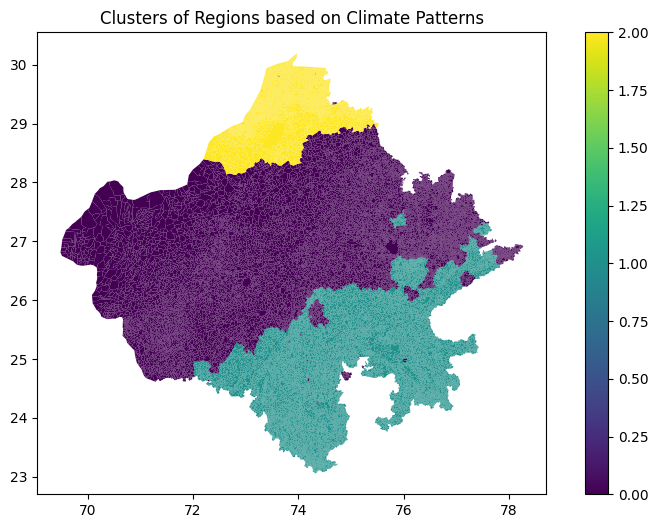

In [ ]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import folium

# Assume the scaled columns already exist, and select them for clustering
scaled_features = ['rain_scaled',
       'pm_2.5_scaled', 'land_surface_temperature_during_day_scaled',
       'land_surface_temperature_during_night_scaled',
       'ultraviolet_index_scaled']

# Create a feature matrix from the scaled columns
features = df[scaled_features]

# Perform K-Means clustering
kmeans = KMeans(n_clusters=3, random_state=42)
df['cluster'] = kmeans.fit_predict(features)

# Convert the DataFrame with clusters back to a GeoDataFrame
gdf = gpd.GeoDataFrame(df, geometry='geometry')

# Plot the clusters on a map using Folium
# Create a Folium map
m = folium.Map(location=[23.08, 74.34], zoom_start=12)

# Add clusters to the map
folium.Choropleth(
    geo_data=gdf,
    data=df,
    columns=['rajas_id', 'cluster'],
    key_on='feature.properties.rajas_id',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Cluster'
).add_to(m)

# Save the map to an HTML file
m.save('cluster_climate.html')

# Plot clusters using Matplotlib for a static view
fig, ax = plt.subplots(1, 1, figsize=(10, 6))
gdf.plot(column='cluster', cmap='viridis', legend=True, ax=ax)
plt.title('Clusters of Regions based on Climate Patterns')
plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


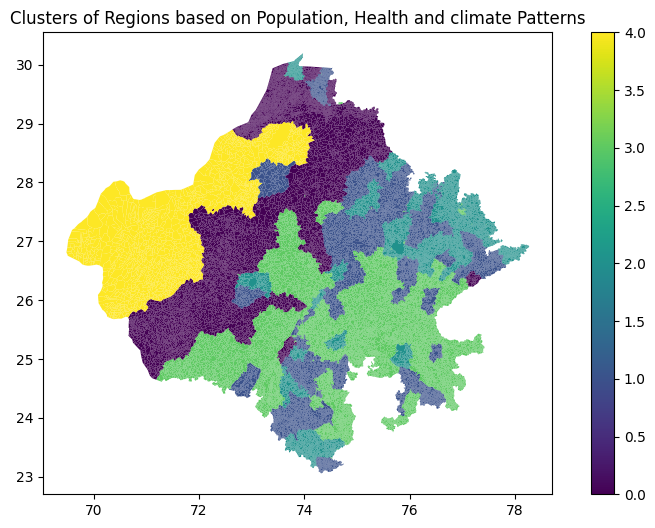

In [ ]:
# Scale the population_density variable
scaler = StandardScaler()
df['population_density_scaled'] = scaler.fit_transform(df[['population_density']])

# Assume the scaled columns already exist, and select them for clustering
scaled_features = [
    'population_density_scaled', 'number_of_tb_cases_scaled', 'number_of_heart_disease_cases_scaled',
    'number_of_cancer_cases_scaled', 'number_of_child_malnutrition_cases_scaled',
    'number_of_maternal_anemia_cases_scaled', 'number_of_smoker_cases_scaled',
    'number_of_lung_problem_cases_scaled', 'rain_scaled', 'pm_2.5_scaled',
    'land_surface_temperature_during_day_scaled', 'land_surface_temperature_during_night_scaled',
    'ultraviolet_index_scaled'
]

# Create a feature matrix from the scaled columns
features = df[scaled_features]

# Perform K-Means clustering
kmeans = KMeans(n_clusters=5, random_state=42)
df['cluster'] = kmeans.fit_predict(features)

# Convert the DataFrame with clusters back to a GeoDataFrame
gdf = gpd.GeoDataFrame(df, geometry='geometry')

# Plot the clusters on a map using Folium
# Create a Folium map
m = folium.Map(location=[23.08, 74.34], zoom_start=12)

# Add clusters to the map
folium.Choropleth(
    geo_data=gdf,
    data=df,
    columns=['rajas_id', 'cluster'],
    key_on='feature.properties.rajas_id',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Cluster'
).add_to(m)

# Save the map to an HTML file
m.save('cluster_analysis_pop.html')

# Plot clusters using Matplotlib for a static view
fig, ax = plt.subplots(1, 1, figsize=(10, 6))
gdf.plot(column='cluster', cmap='viridis', legend=True, ax=ax)
plt.title('Clusters of Regions based on Population, Health and climate Patterns')
plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


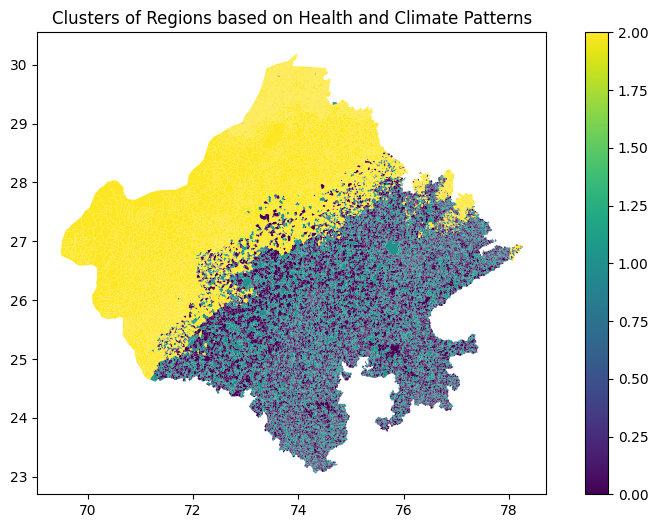

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import folium
import geopandas as gpd


scaled_features2 = [
    'number_of_tb_cases_scaled', 'number_of_heart_disease_cases_scaled',
    'number_of_cancer_cases_scaled', 'number_of_child_malnutrition_cases_scaled',
    'number_of_maternal_anemia_cases_scaled', 'number_of_smoker_cases_scaled',
    'number_of_lung_problem_cases_scaled', 'rain_scaled', 'pm_2.5_scaled',
    'land_surface_temperature_during_day_scaled', 'land_surface_temperature_during_night_scaled',
    'ultraviolet_index_scaled'
]
# Create a feature matrix from the scaled columns
features2 = df[scaled_features2]

# Perform K-Means clustering
kmeans = KMeans(n_clusters=3, random_state=42)
df['cluster2'] = kmeans.fit_predict(features2)

# Convert the DataFrame with clusters back to a GeoDataFrame
gdf = gpd.GeoDataFrame(df, geometry='geometry')

# Plot the clusters on a map using Folium
# Create a Folium map
m2 = folium.Map(location=[23.08, 74.34], zoom_start=12)

# Add clusters to the map
folium.Choropleth(
    geo_data=gdf,
    data=df,
    columns=['rajas_id', 'cluster2'],
    key_on='feature.properties.rajas_id',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Cluster'
).add_to(m2)

# Save the map to an HTML file
m2.save('cluster_analysis_hc_final.html')

# Plot clusters using Matplotlib for a static view
fig, ax = plt.subplots(1, 1, figsize=(10, 6))
gdf.plot(column='cluster2', cmap='viridis', legend=True, ax=ax)
plt.title('Clusters of Regions based on Health and Climate Patterns')
plt.show()

**INSIGHTS**

The final map clearly shows two major climate clusters in Rajasthan - a large yellow region in the west and northwest, and a predominantly blue-green region covering the rest of the state.

This means that whle keeping the climate and health variables in mind, we can develop region-specific climate adaptation and health intervention strategies tailored to these distinct zones.

### 3.	Correlation Analysis

In [20]:
scaled_h_vars = [ 'number_of_tb_cases_scaled',
       'number_of_heart_disease_cases_scaled', 'number_of_cancer_cases_scaled',
       'number_of_child_malnutrition_cases_scaled',
       'number_of_maternal_anemia_cases_scaled',
       'number_of_smoker_cases_scaled', 'number_of_lung_problem_cases_scaled']

scaled_c_vars = ['rain_scaled', 'pm_2.5_scaled',
       'land_surface_temperature_during_day_scaled',
       'land_surface_temperature_during_night_scaled',
       'ultraviolet_index_scaled']

Since the correlations are small, we do not plot a regular heatmap of all variables but plot each one with one climate variable and all health variables. The min and max correl is also adjusted.

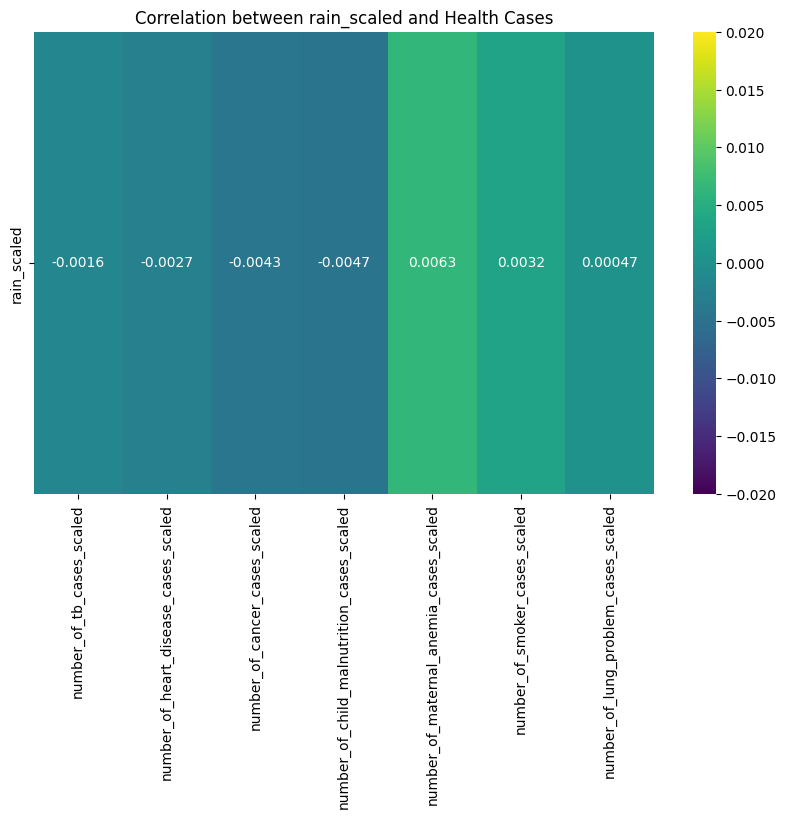

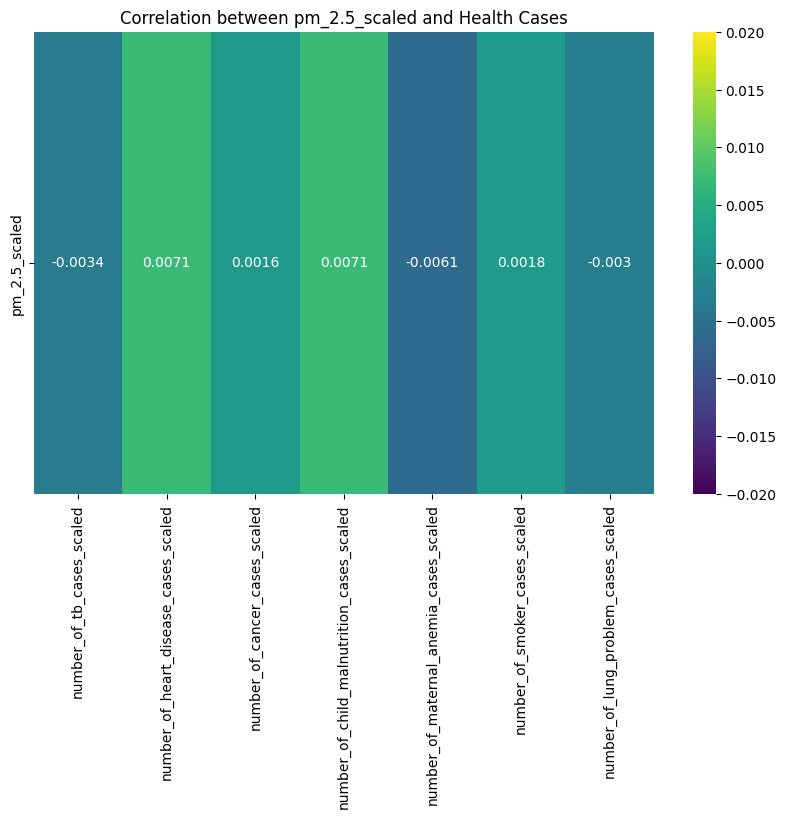

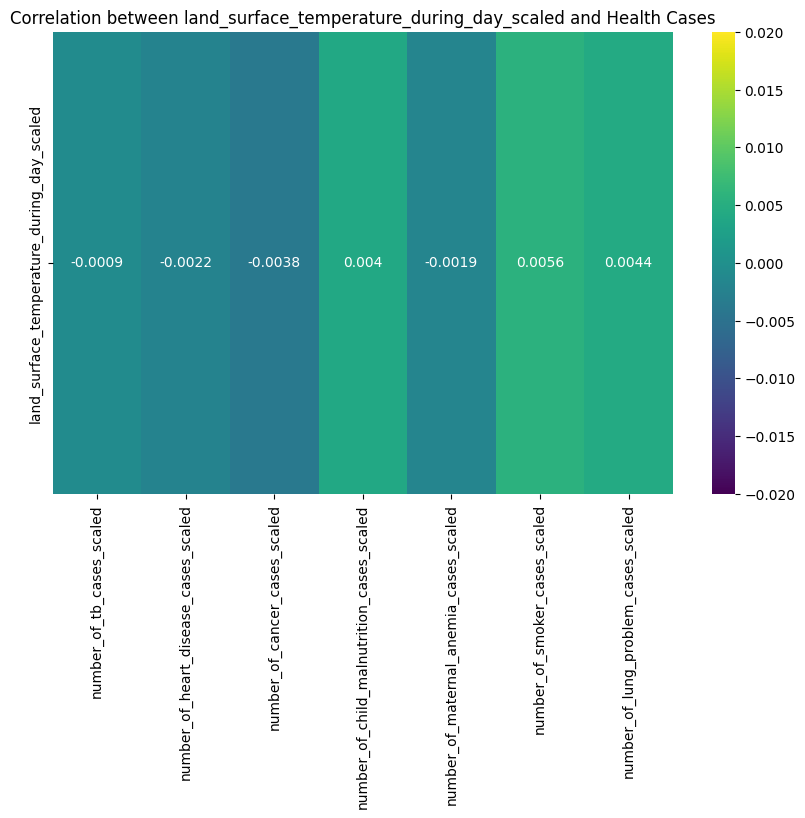

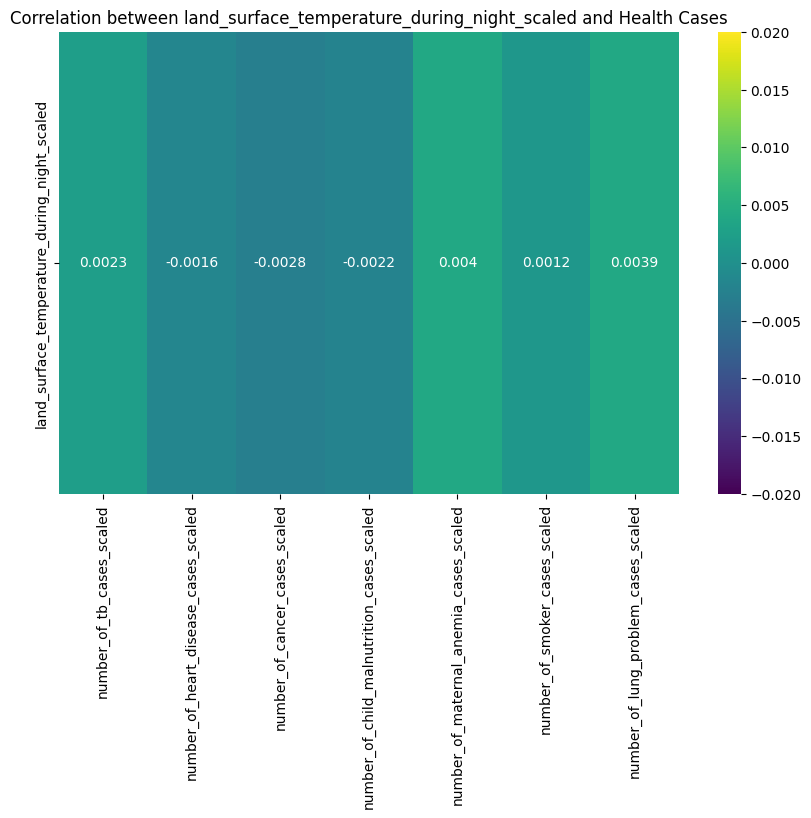

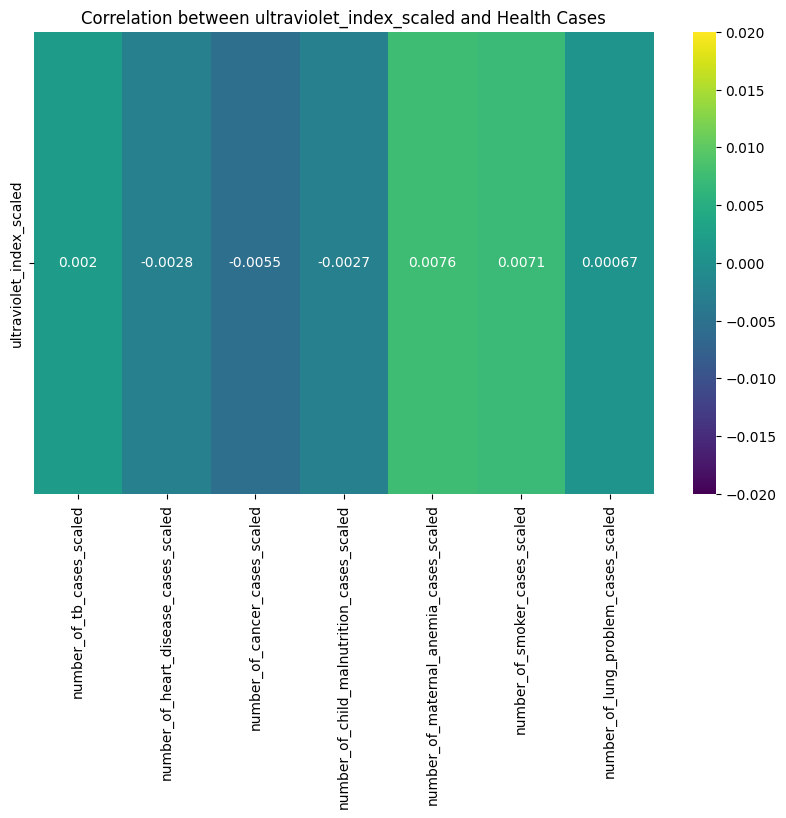

In [21]:
# Loop through the first three climate variables
for var in scaled_c_vars:
    # Calculate the correlation matrix for the current climate variable and all health variables
    correlation_matrix = df[[var] + scaled_h_vars].corr()

    # Extract the correlations with the current climate variable
    correlation_submatrix = correlation_matrix.loc[[var], scaled_h_vars]

    # Plot the heatmap
    plt.figure(figsize=(10, 6))
    sns.heatmap(correlation_submatrix, annot=True, cmap='viridis', vmin=-0.02, vmax=0.02, center=0)
    plt.title(f'Correlation between {var} and Health Cases')
    plt.show()

In [22]:
df['total_h_cases']=df[health_vars].sum(axis=1)

In [26]:
# Perform Min-Max scaling
scaler = MinMaxScaler()
total_h_cases_scaled = scaler.fit_transform(df.total_h_cases.values.reshape(-1, 1))

# Add total_h_cases_scaled as a new column in df
df['total_h_cases_scaled'] = total_h_cases_scaled

In [27]:
df.head()

,rajas_id,block_code_census,rain,population_density,rural_facilities,land_surface_temperature_during_day,land_surface_temperature_during_night,ultraviolet_index,pm_2.5,number_of_tb_cases,...,ultraviolet_index_scaled,number_of_tb_cases_scaled,number_of_heart_disease_cases_scaled,number_of_cancer_cases_scaled,number_of_child_malnutrition_cases_scaled,number_of_maternal_anemia_cases_scaled,number_of_smoker_cases_scaled,number_of_lung_problem_cases_scaled,total_h_cases,total_h_cases_scaled
0,1.0,3151,2.631036,5.861466,148.0,15297.0,14574.0,10.089448,41.219,0,...,1.0,0.000000,0.736842,1.000000,0.153846,0.714286,0.352381,0.363636,98,0.330579
1,2.0,3151,2.631036,5.861466,148.0,15297.0,14574.0,10.089448,41.219,44,...,1.0,0.758621,0.789474,0.785714,0.692308,0.142857,0.780952,0.522727,187,0.698347
2,3.0,3151,2.631036,5.861466,148.0,15297.0,14574.0,10.089448,41.219,22,...,1.0,0.379310,0.789474,0.214286,0.615385,0.380952,0.019048,0.795455,93,0.309917
3,4.0,3151,2.631036,5.861466,148.0,15297.0,14574.0,10.089448,41.219,42,...,1.0,0.724138,0.052632,0.000000,0.769231,0.619048,0.419048,0.886364,149,0.541322
4,5.0,3151,2.631036,5.861466,148.0,15297.0,14574.0,10.089448,41.219,29,...,1.0,0.500000,0.052632,0.928571,0.923077,0.714286,0.742857,0.886364,187,0.698347


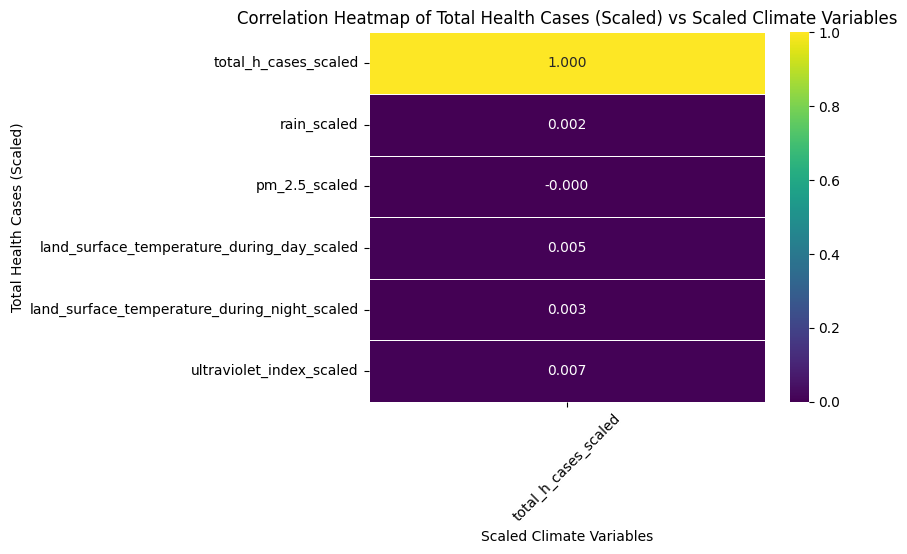

In [28]:
# Calculate correlation matrix
correlation_matrix = df[['total_h_cases_scaled'] + scaled_c_vars].corr()

# Plot heatmap
sns.heatmap(correlation_matrix[['total_h_cases_scaled']], annot=True, cmap='viridis', fmt='.3f', linewidths=.5)
plt.title('Correlation Heatmap of Total Health Cases (Scaled) vs Scaled Climate Variables')
plt.xlabel('Scaled Climate Variables')
plt.ylabel('Total Health Cases (Scaled)')
plt.xticks(rotation=45)
plt.show()

In [19]:
df.head()


,rajas_id,block_code_census,rain,population_density,rural_facilities,land_surface_temperature_during_day,land_surface_temperature_during_night,ultraviolet_index,pm_2.5,number_of_tb_cases,...,land_surface_temperature_during_night_scaled,ultraviolet_index_scaled,number_of_tb_cases_scaled,number_of_heart_disease_cases_scaled,number_of_cancer_cases_scaled,number_of_child_malnutrition_cases_scaled,number_of_maternal_anemia_cases_scaled,number_of_smoker_cases_scaled,number_of_lung_problem_cases_scaled,total_h_cases
0,1.0,3151,2.631036,5.861466,148.0,15297.0,14574.0,10.089448,41.219,0,...,0.590909,1.0,0.000000,0.736842,1.000000,0.153846,0.714286,0.352381,0.363636,98
1,2.0,3151,2.631036,5.861466,148.0,15297.0,14574.0,10.089448,41.219,44,...,0.590909,1.0,0.758621,0.789474,0.785714,0.692308,0.142857,0.780952,0.522727,187
2,3.0,3151,2.631036,5.861466,148.0,15297.0,14574.0,10.089448,41.219,22,...,0.590909,1.0,0.379310,0.789474,0.214286,0.615385,0.380952,0.019048,0.795455,93
3,4.0,3151,2.631036,5.861466,148.0,15297.0,14574.0,10.089448,41.219,42,...,0.590909,1.0,0.724138,0.052632,0.000000,0.769231,0.619048,0.419048,0.886364,149
4,5.0,3151,2.631036,5.861466,148.0,15297.0,14574.0,10.089448,41.219,29,...,0.590909,1.0,0.500000,0.052632,0.928571,0.923077,0.714286,0.742857,0.886364,187


**INSIGHTS**

1.
2.


### 5.	Hypothesis Testing

Research Question:
What is the relationship between the concentration of PM 2.5 and the number of child malnutrition cases in the region?

This section will try to find:
How does the level of PM 2.5, a common air pollutant, correlate with the prevalence of child malnutrition cases across various blocks in the region? Specifically, does higher exposure to PM 2.5 correlate with an increase in the number of child malnutrition cases, suggesting a potential impact of air pollution on children's nutritional health?

Literature:
Understanding the relationship between air pollution and child malnutrition is crucial for public health policy and intervention strategies. PM 2.5, fine particulate matter with a diameter of 2.5 micrometers or less, is known to have various adverse health effects. Investigating its potential impact on child nutrition can help in formulating targeted interventions to improve children's health outcomes.
Some literature around this can be seen in (Ghosh et al. 2021)

Hypothesis:
Higher levels of PM 2.5 are associated with an increased number of child malnutrition cases.



In [14]:
df.head()

,rajas_id,block_code_census,rain,population_density,rural_facilities,land_surface_temperature_during_day,land_surface_temperature_during_night,ultraviolet_index,pm_2.5,number_of_tb_cases,...,land_surface_temperature_during_day_scaled,land_surface_temperature_during_night_scaled,ultraviolet_index_scaled,number_of_tb_cases_scaled,number_of_heart_disease_cases_scaled,number_of_cancer_cases_scaled,number_of_child_malnutrition_cases_scaled,number_of_maternal_anemia_cases_scaled,number_of_smoker_cases_scaled,number_of_lung_problem_cases_scaled
0,1.0,3151,2.631036,5.861466,148.0,15297.0,14574.0,10.089448,41.219,0,...,0.687093,0.590909,1.0,0.000000,0.736842,1.000000,0.153846,0.714286,0.352381,0.363636
1,2.0,3151,2.631036,5.861466,148.0,15297.0,14574.0,10.089448,41.219,44,...,0.687093,0.590909,1.0,0.758621,0.789474,0.785714,0.692308,0.142857,0.780952,0.522727
2,3.0,3151,2.631036,5.861466,148.0,15297.0,14574.0,10.089448,41.219,22,...,0.687093,0.590909,1.0,0.379310,0.789474,0.214286,0.615385,0.380952,0.019048,0.795455
3,4.0,3151,2.631036,5.861466,148.0,15297.0,14574.0,10.089448,41.219,42,...,0.687093,0.590909,1.0,0.724138,0.052632,0.000000,0.769231,0.619048,0.419048,0.886364
4,5.0,3151,2.631036,5.861466,148.0,15297.0,14574.0,10.089448,41.219,29,...,0.687093,0.590909,1.0,0.500000,0.052632,0.928571,0.923077,0.714286,0.742857,0.886364


                                        OLS Regression Results                                       
Dep. Variable:     number_of_child_malnutrition_cases_scaled   R-squared:                       0.000
Model:                                                   OLS   Adj. R-squared:                  0.000
Method:                                        Least Squares   F-statistic:                     2.287
Date:                                       Wed, 17 Jul 2024   Prob (F-statistic):              0.130
Time:                                               12:35:35   Log-Likelihood:                -11169.
No. Observations:                                      45040   AIC:                         2.234e+04
Df Residuals:                                          45038   BIC:                         2.236e+04
Df Model:                                                  1                                         
Covariance Type:                                   nonrobust                      

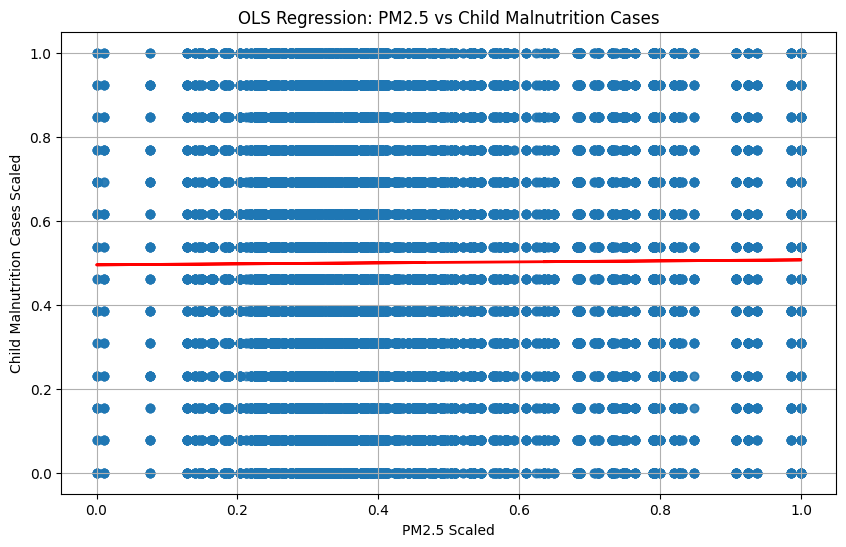

In [ ]:
import pandas as pd
import statsmodels.api as sm
import matplotlib.pyplot as plt

# Assuming df contains your dataset with the scaled variables

# Prepare the data
X = df['pm_2.5_scaled']
y = df['number_of_child_malnutrition_cases_scaled']

# Add constant to X for OLS
X = sm.add_constant(X)

# Fit OLS model
model = sm.OLS(y, X).fit()

# Print model summary
print(model.summary())

# Plotting the regression line
plt.figure(figsize=(10, 6))
plt.scatter(X['pm_2.5_scaled'], y, alpha=0.5)  # Scatter plot
plt.plot(X['pm_2.5_scaled'], model.predict(), color='red', linewidth=2)  # Regression line
plt.title('OLS Regression: PM2.5 vs Child Malnutrition Cases')
plt.xlabel('PM2.5 Scaled')
plt.ylabel('Child Malnutrition Cases Scaled')
plt.grid(True)
plt.show()

Using Spearman's rank correlation coefficient here as is a robust method for hypothesis testing when dealing with non-normally distributed data to verify that there is no significant relationship

In [ ]:
import pandas as pd
import scipy.stats as stats

# Assuming df is your DataFrame containing the relevant columns

# Calculate Spearman's rank correlation coefficient
spearman_corr, p_value = stats.spearmanr(df['pm_2.5_scaled'], df['number_of_child_malnutrition_cases_scaled'])

# Print the results
print(f"Spearman's rank correlation coefficient: {spearman_corr}")
print(f"P-value: {p_value}")

# Interpret the results
if p_value < 0.05:
    print("The correlation between PM2.5 and child malnutrition is statistically significant.")
else:
    print("The correlation between PM2.5 and child malnutrition is not statistically significant.")


Spearman's rank correlation coefficient: 0.005927284592794818
P-value: 0.20842727944660244
The correlation between PM2.5 and child malnutrition is not statistically significant.


As the null hypothesis is accepted here, we try to find if there are any dependencies that can be seen.

Another variable was introduced that could have adverse effect on children's health to see if the interaction hold any significance.

In [ ]:
import statsmodels.api as sm

# Prepare the data
X = df[['pm_2.5_scaled', 'land_surface_temperature_during_day_scaled', 'population_density_scaled']]
y = df['number_of_child_malnutrition_cases_scaled']

# Add interaction term
df['pm2.5_day_temp_interaction'] = df['pm_2.5_scaled'] * df['land_surface_temperature_during_day_scaled']

# Fit the model with interaction term
X = sm.add_constant(df[['pm_2.5_scaled', 'land_surface_temperature_during_day_scaled', 'pm2.5_day_temp_interaction', 'population_density_scaled']])
model_interaction = sm.OLS(y, X).fit()

# Print the summary of the model
print(model_interaction.summary())


                                        OLS Regression Results                                       
Dep. Variable:     number_of_child_malnutrition_cases_scaled   R-squared:                       0.000
Model:                                                   OLS   Adj. R-squared:                 -0.000
Method:                                        Least Squares   F-statistic:                    0.7063
Date:                                       Wed, 17 Jul 2024   Prob (F-statistic):              0.587
Time:                                               12:13:21   Log-Likelihood:                -11169.
No. Observations:                                      45040   AIC:                         2.235e+04
Df Residuals:                                          45035   BIC:                         2.239e+04
Df Model:                                                  4                                         
Covariance Type:                                   nonrobust                      

The regression analysis indicates that the predictors (pm_2.5_scaled, land_surface_temperature_during_day_scaled, pm2.5_day_temp_interaction, and population_density_scaled) do not significantly explain the variance in the number of child malnutrition cases. The R-squared value of 0.000 and high p-values for all predictors suggest that there is no meaningful relationship between the selected climatic variables and child malnutrition in this model.

As further investigation with different variables , we proceed to see this by clusters that we identified earlier.

In [ ]:
import statsmodels.api as sm

# Iterate over each cluster and fit separate models
for cluster_num in range(3):
    # Filter data for the current cluster
    cluster_data = df[df['cluster'] == cluster_num]

    # Prepare the data
    X = cluster_data[['pm_2.5_scaled', 'land_surface_temperature_during_day_scaled', 'population_density_scaled']]
    y = cluster_data['number_of_child_malnutrition_cases_scaled']

    # Add interaction term
    cluster_data['pm2.5_day_temp_interaction'] = cluster_data['pm_2.5_scaled'] * cluster_data['land_surface_temperature_during_day_scaled']

    # Fit the model with interaction term
    X = sm.add_constant(cluster_data[['pm_2.5_scaled', 'land_surface_temperature_during_day_scaled', 'pm2.5_day_temp_interaction', 'population_density_scaled']])
    model_interaction = sm.OLS(y, X).fit()

    # Print the summary of the model
    print(f"Cluster {cluster_num} Regression Summary:")
    print(model_interaction.summary())
    print("\n")


/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Cluster 0 Regression Summary:
                                        OLS Regression Results                                       
Dep. Variable:     number_of_child_malnutrition_cases_scaled   R-squared:                       0.007
Model:                                                   OLS   Adj. R-squared:                  0.007
Method:                                        Least Squares   F-statistic:                     27.73
Date:                                       Wed, 17 Jul 2024   Prob (F-statistic):           5.62e-23
Time:                                               12:20:25   Log-Likelihood:                 7116.1
No. Observations:                                      15915   AIC:                        -1.422e+04
Df Residuals:                                          15910   BIC:                        -1.418e+04
Df Model:                                                  4                                         
Covariance Type:                                   n

/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


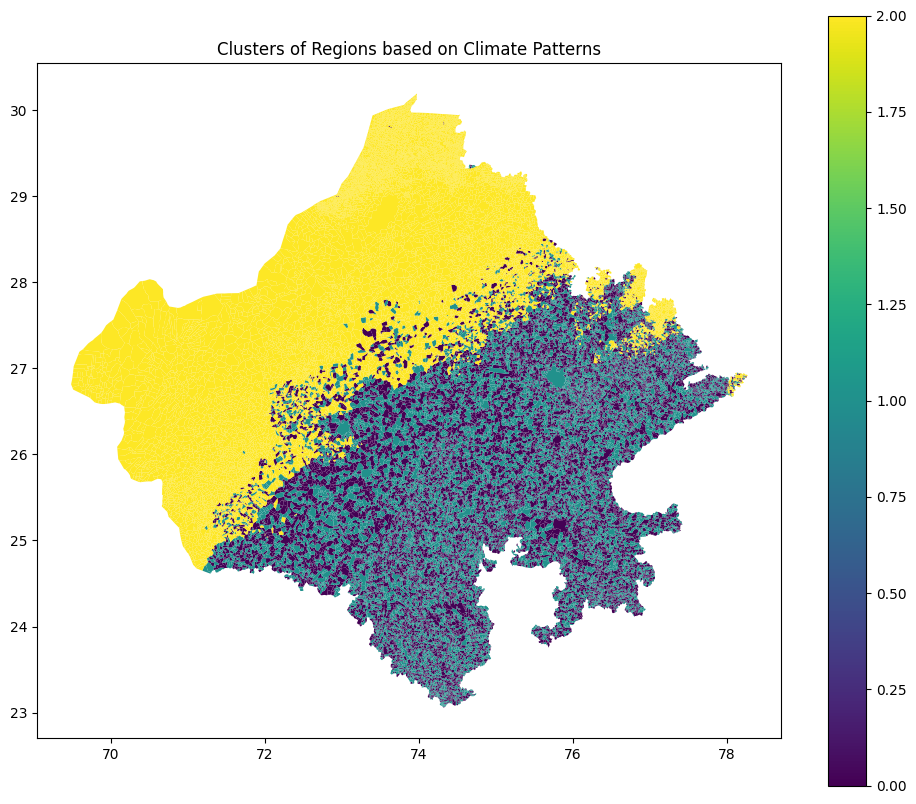

In [ ]:
gdf = gpd.GeoDataFrame(df, geometry='geometry')

# Plotting the clusters on a map
fig, ax = plt.subplots(figsize=(12, 10))
gdf.plot(column='cluster', cmap='viridis', legend=True, ax=ax)
plt.title('Clusters of Regions based on Climate Patterns')
plt.show()

For Cluster 0, the R-squared value is 0.007, indicating that the model explains only 0.7% of the variability in child malnutrition cases. Cluster 1 has a similar R-squared value of 0.007, with one statistically significant interaction term (pm2.5_day_temp_interaction). Cluster 2 has an R-squared value of 0.000, meaning the predictors do not explain the variability in child malnutrition cases in this cluster.

### 6.	Insights and Recommendations



**Integrated Air Quality and Temperature Management for Cluster 1:**

Recommendations are :
- Given the significant interaction between PM2.5 levels and daytime temperatures, policies in Cluster 1 should focus on addressing air quality and temperature management simultaneously.
- We recommend to implement measures to reduce air pollution, especially during hot weather periods, to minimize exposure to poor air quality. This could include increasing green cover, promoting the use of public transport, and regulating industrial emissions.

**Programs Addressing Child Malnutrition in Cluster 1, Particularly Around Jaipur:**

Recommendations are :
- Expand and enhance existing programs like mid-day meals in schools to ensure children receive adequate nutrition especially in Cluster 1 schools.
- Hospitals, schools, and community centers in these areas should have accessible community education resources focused on nutrition and health. Educate new mothers on nutriton.
- Conduct regular health camps and nutritional assessments to identify and address malnutrition early, involving local healthcare providers and nutritionists in intervention strategies.

**Strategic Distribution of Medical Resources Based on Cluster Analysis:**

Recommendations are :
- Align the distribution of medical facilities, specialized equipment, and trained personnel to match the health challenges identified in each climate cluster.
- Utilize the geospatial data to predict the number of cases and ensure hospitals in these areas are well-prepared. For example, areas with higher predicted cases of respiratory issues should have sufficient pulmonary specialists and equipment like ventilators.


REFERENCES

1. Ghosh, R., Causey, K., Burkart, K., Wozniak, S., Cohen, A., & Brauer, M. (2021). Ambient and household PM2.5 pollution and adverse perinatal outcomes: A meta-regression and analysis of attributable global burden for 204 countries and territories. PLoS Medicine, 18. https://doi.org/10.1371/journal.pmed.1003718.